# Methods at Manchester Empirical Section

This file provides code for the empirical part of the workshop on Topological Data Analysis Ball Mapper (TDABM) held at the University of Manchester on the 18th November 2025. The code in this file provides replication in Python.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import pandas as pd
import random
import networkx as nx
import sklearn
import statistics
import pyballmapper as pbm
import geopandas as gpd

from matplotlib.colors import ListedColormap
from matplotlib import colormaps as cm

As a first step let us upload the shape file of the LSOAs in England and Wales. Because we study England and Wales the object name is ew.

In [6]:
ew_shape=gpd.read_file('LSOA_2021_EW_BSC_V4.shp')

The shapefile can be plotted to see the whole of England and Wales

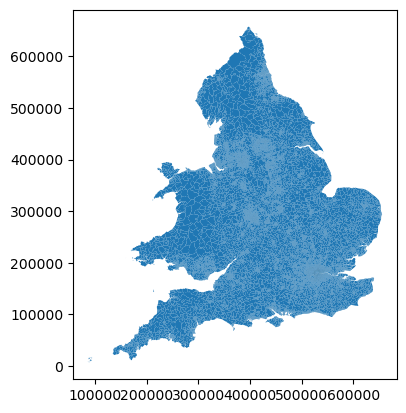

In [10]:
ew_shape.plot()

plt.savefig('allLSOA.png')

## Loading Data

We now load in the two .csv files that are provided with the workshop. Note that we will not be using the normalised file for the exploratory analysis

In [49]:
df1 = pd.read_csv('fulldata.csv')
nd1 = pd.read_csv('normalised.csv')

We can also add the summary statistics function that was used in the artificial data case

In [12]:
df2 = df1[['IMD','INC','EMP','EST','HDD','CRM','BHS','LIV','CYP','ADS']]

We then create the blank summary statistics storage table

In [13]:
sdep = pd.DataFrame(columns=['Var', 'Mean', 'SD','Min','q25','q50','q75','Max'], index=range(df2.shape[1]))

And populate the table in the same way as was done for the artificial data

In [15]:
for i in range(df2.shape[1]):
  sdep.loc[i,'Var'] = df2.columns[i]
  sdep.loc[i,'Mean'] = round(np.mean(df2.iloc[:,i]),3)
  sdep.loc[i,'SD'] = round(statistics.stdev(df2.iloc[:,i]),3)
  sdep.loc[i,'Min'] = round(min(df2.iloc[:,i]),3)
  sdep.loc[i,'q25'] = round(np.quantile(df2.iloc[:,i],0.25),3)
  sdep.loc[i,'q50'] = round(np.quantile(df2.iloc[:,i],0.50),3)
  sdep.loc[i,'q75'] = round(np.quantile(df2.iloc[:,i],0.75),3)
  sdep.loc[i,'Max'] = round(max(df2.iloc[:,i]),3)

sdep


,Var,Mean,SD,Min,q25,q50,q75,Max
0,IMD,28.45,18.886,0.604,11.861,24.956,43.077,82.633
1,INC,0.283,0.187,0.011,0.111,0.254,0.435,0.812
2,EMP,0.17,0.098,0.007,0.085,0.154,0.239,0.555
3,EST,24.576,18.988,0.093,7.611,20.949,38.149,84.579
4,HDD,0.561,0.802,-1.97,-0.032,0.616,1.149,2.962
5,CRM,0.49,0.781,-1.95,-0.033,0.563,1.051,2.575
6,BHS,19.583,9.732,3.044,12.352,17.954,24.481,60.945
7,LIV,25.288,14.942,0.46,13.504,22.754,34.32,80.329
8,CYP,-0.012,0.925,-2.612,-0.646,0.083,0.651,2.752
9,ADS,0.264,0.114,0.022,0.177,0.253,0.344,0.601


The summary statistics demonstrate that the data is not on the same scales. Where Crime ranges from -1.95 to 2.575, the Education Skills and Training variable runs from 0.09 to 84.579. As such it is necessary to normalise the data before running the TDABM. It is because of the need to normalise that the normalised file is provided.

We can also construct a correlation matrix for the non-normalised data to check structures

In [16]:
Corr_Matrix = round(df2.corr(),3)
print(Corr_Matrix)

       IMD    INC    EMP    EST    HDD    CRM    BHS    LIV    CYP    ADS
IMD  1.000  0.975  0.962  0.927  0.888  0.841  0.564  0.210  0.771  0.895
INC  0.975  1.000  0.951  0.912  0.830  0.776  0.537  0.164  0.733  0.916
EMP  0.962  0.951  1.000  0.896  0.865  0.791  0.433  0.055  0.768  0.859
EST  0.927  0.912  0.896  1.000  0.810  0.745  0.446  0.125  0.856  0.918
HDD  0.888  0.830  0.865  0.810  1.000  0.832  0.441  0.131  0.812  0.751
CRM  0.841  0.776  0.791  0.745  0.832  1.000  0.404  0.250  0.750  0.682
BHS  0.564  0.537  0.433  0.446  0.441  0.404  1.000  0.116  0.301  0.525
LIV  0.210  0.164  0.055  0.125  0.131  0.250  0.116  1.000  0.066  0.196
CYP  0.771  0.733  0.768  0.856  0.812  0.750  0.301  0.066  1.000  0.694
ADS  0.895  0.916  0.859  0.918  0.751  0.682  0.525  0.196  0.694  1.000


Generally the correlations between the different measures are high, but we do see that correlations between living environment and many of the deprivation measures are low. Further, the correlations with the barriers to housing services (BHS) variable are all between 0.3 and 0.6. 

Let us create some dummy variables to use in the analysis. Recall that a higher value of IMD means more deprived, so to identify the 25% most deprived neighbourhoods we need to look for those with IMD above the 75th percentile.

In [51]:
df1['IMD25'] = (df1['IMD']>df1['IMD'].quantile(0.75))*1
df1['IDACI25'] = (df1['IDACI']>df1['IDACI'].quantile(0.75))*1
df1['IDAOPI25'] = (df1['IDAOPI']>df1['IDAOPI'].quantile(0.75))*1

To see the structure of the data we can create scatterplots. The first considers Education, Skills and Training with Children and Young People

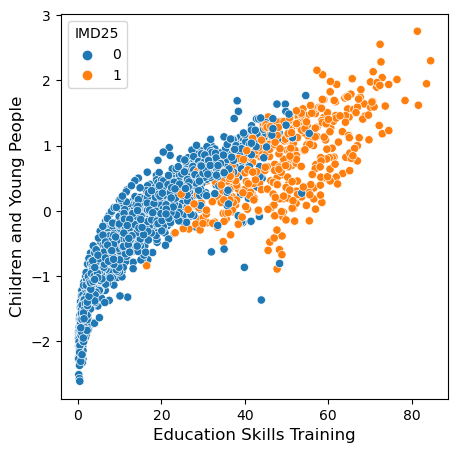

In [36]:
fig, ax = plt.subplots(figsize = ( 5 , 5 )) 
sb.scatterplot( ax = ax , x = df1['EST'] , y = df1['CYP'] , data = df1 , hue=df1['IMD25']) 

ax.set_xlabel( "Education Skills Training" , size = 12 ) 
ax.set_ylabel( "Children and Young People" , size = 12 ) 
 
plt.savefig("ESTCYP25.png")

The scatterplot shows a reasonable ability to split out the higher deprivation areas. The orange dots are generally to the right. However, there are notable overlaps with the blues.

The second scatterplot considers Geographical Barriers and the Living Environment

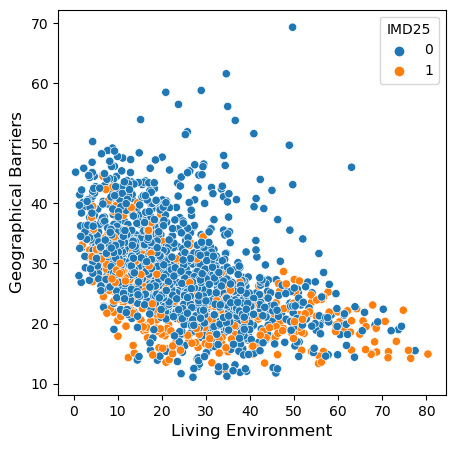

In [37]:
fig, ax = plt.subplots(figsize = ( 5 , 5 )) 
sb.scatterplot( ax = ax , x = df1['LIV'] , y = df1['GEO'] , data = df1 , hue=df1['IMD25']) 

ax.set_xlabel( "Living Environment" , size = 12 ) 
ax.set_ylabel( "Geographical Barriers" , size = 12 ) 
 
plt.savefig("LIVGEO25.png")

The spread of the oranges is much greater in this second plot. There are orange dots at almost all levels of both variables.

To see the overall picture for the three dummies let us use the Seaborn pairplot

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


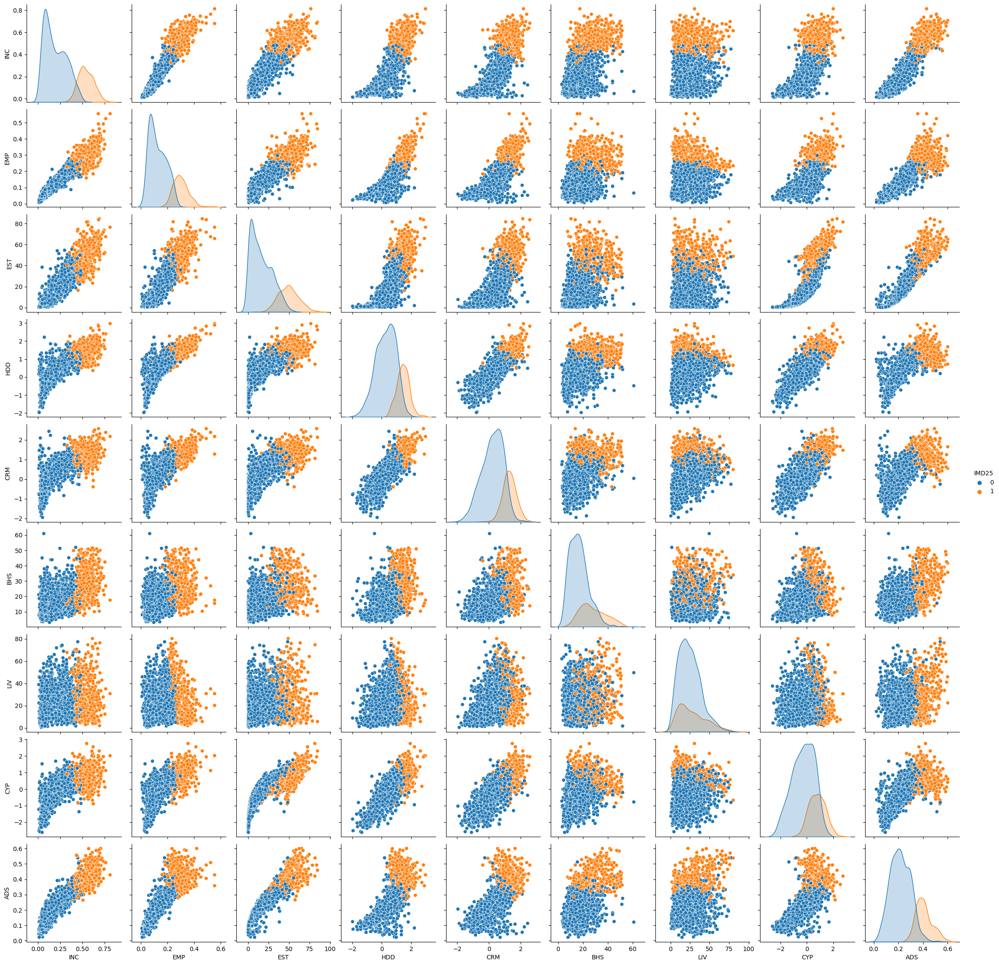

In [38]:
df3 = df1[['IMD25','INC','EMP','EST','HDD','CRM','BHS','LIV','CYP','ADS']]

sb.pairplot(df3, hue='IMD25')

plt.savefig("IMD25pp.png")

The majority of variables appear to split out the oranges when interacted pairwise. The distributions on the leading diagonal emphasise that there is some overlap between the groups. No pair can perfectly separate the groups.

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


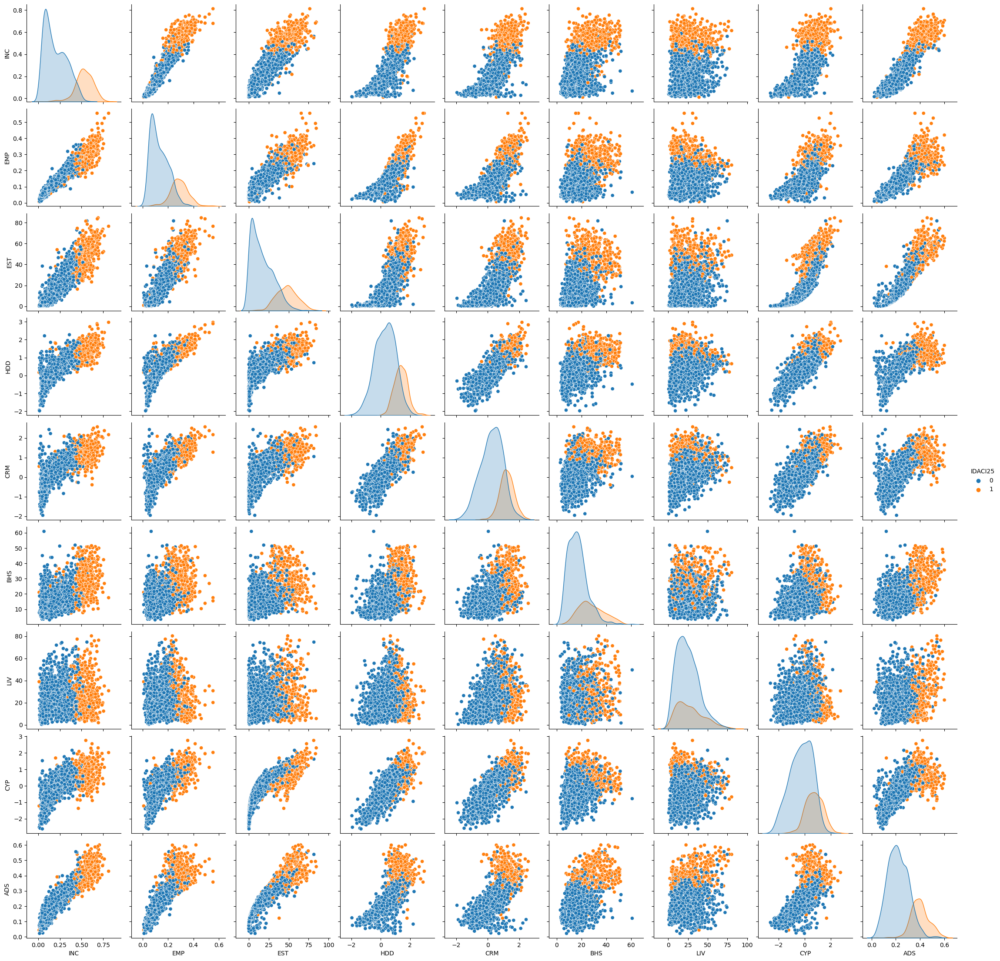

In [39]:
df3 = df1[['IDACI25','INC','EMP','EST','HDD','CRM','BHS','LIV','CYP','ADS']]

sb.pairplot(df3, hue='IDACI25')

plt.savefig("IDACI25pp.png")

With the impact on children index the overlaps are stronger. For this reason we would want to know if interacting more variables would help segregate the orange from the blue

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


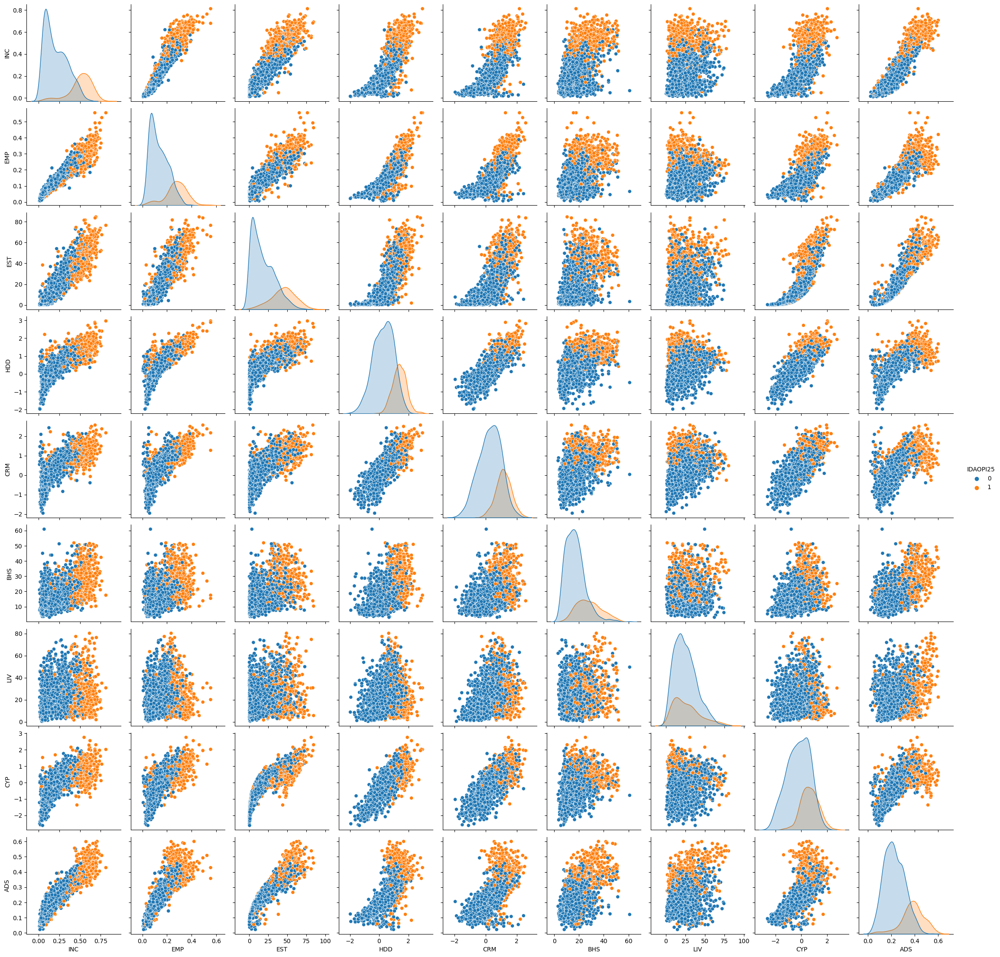

In [40]:
df3 = df1[['IDAOPI25','INC','EMP','EST','HDD','CRM','BHS','LIV','CYP','ADS']]

sb.pairplot(df3, hue='IDAOPI25')

plt.savefig("IDAOPI25pp.png")

As with the impact on children, the impact on the older generations is also more blurred on each of the pairwise plots.

The three pairplots show the strong relationship between the top 25 percent and the variables. However, there are still some patterns and overlaps which are worthy of investigation. For this reason we will employ TDABM to plot the joint distribution of all variables at the same time.

# Mapping

In this section we will plot the data to obtain a spatial impression of the information in the .csv files. The first step ensures that the names are of the same type. We then merge the map data with the data file. There are a wealth of libraries available for mapping and if undertaking research with geographic data it is a good idea to spend more time trying to produce effective maps. Here we will be using the maps for illustration only

In [27]:
ew_shape["LSOA21CD"] = ew_shape["LSOA21CD"].astype(str)
df1["LSOA2021"]   = df1["LSOA2021"].astype(str)

Now we can perform the merge using the LSOA codes

In [29]:
ew_shape_man = ew_shape[ew_shape["LSOA21CD"].isin(df1["LSOA2021"])]

We can then produce a map which will now only show the Greater Manchester LSOAs

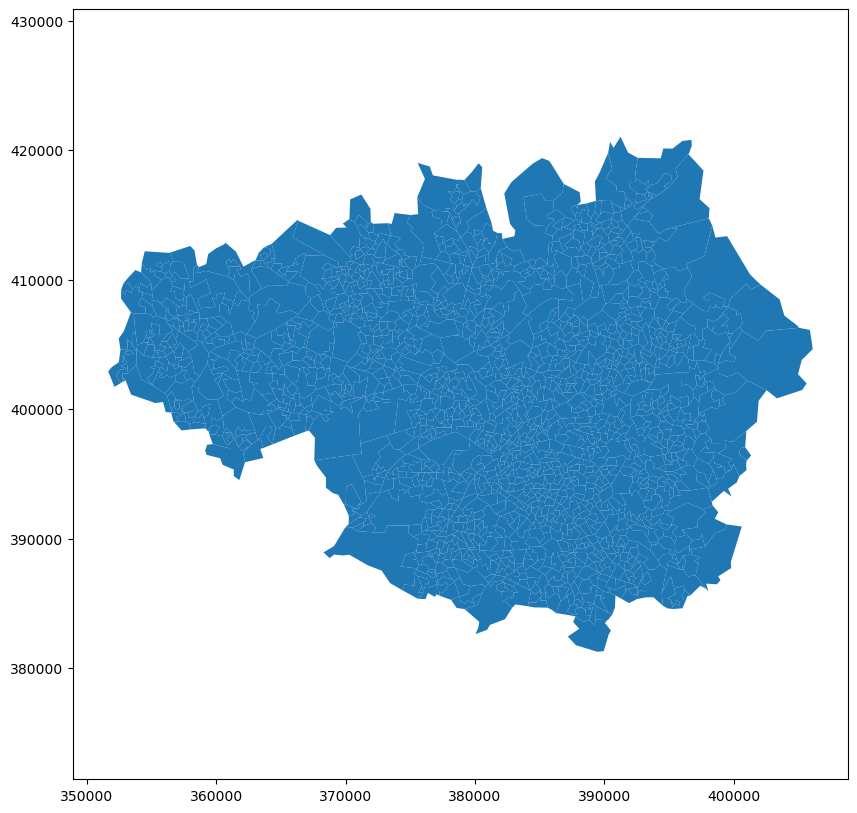

In [30]:
ew_shape_man.plot(figsize=(10, 10))
plt.axis('equal')
plt.show()

For those familiar with Greater Manchester, the shape is recognisable. 

We can then merge this with the data to plot our variables on the map

In [43]:
ew_shape_merged = ew_shape_man.merge(
    df1, 
    left_on="LSOA21CD", 
    right_on="LSOA2021",
    how="left"
)

Then let us see where the 25% most deprived LSOAs are within Greater Manchester

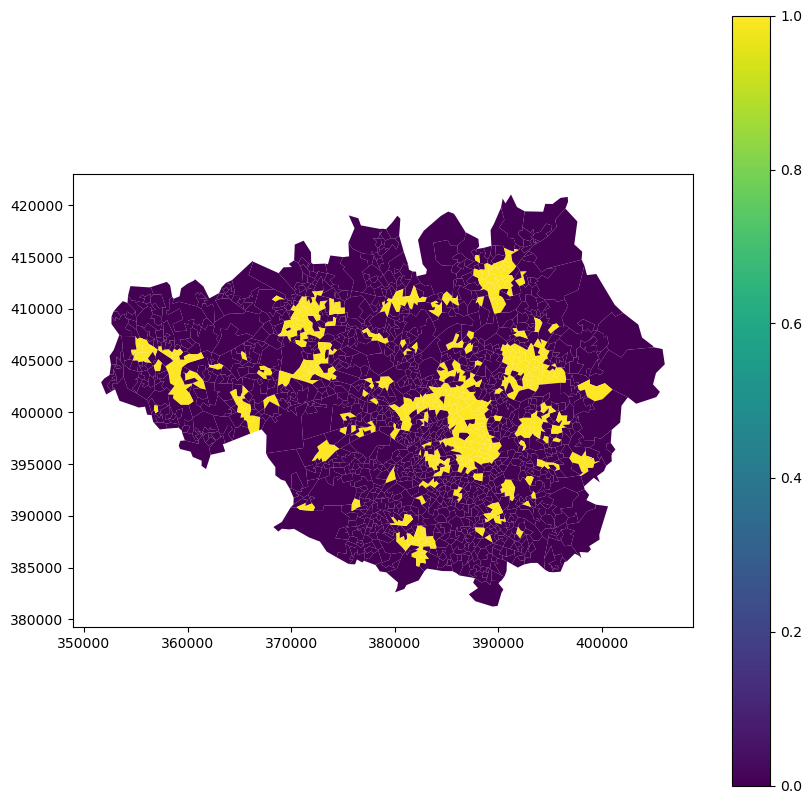

In [44]:
ew_shape_merged.plot(
    column="IMD25",
    legend=True,
    figsize=(10, 10)
)
plt.savefig("mapIMD25.png")

The most deprived areas are all located near the centres of the major connurbations. The locations around Oldham, Rochdale, Bury, Bolton, Wigan, Stockport and Wythenshawe, together with swathes of East Manchester are unsurprising. It is reassuring to know that the index is consistent with expectations here.

# Topological Data Analysis Ball Mapper

The elements needed for a TDABM plot are the axis variables, the outcome variable and a choice of radius. In this case we are working with data on different scales so we will make use of the normalised.csv file for this part. The LSOA code will help us later. Before getting started let us ensure that the normalised data is sorted according to the LSOA code. The index is called point ready for merging with the TDABM output.

In [90]:
nd1 = nd1.sort_values(by="LSOA2021").reset_index(drop=True)
nd1["point"] = nd1.index
nd1.head()

,LSOA2021,INCN,EMPN,ESTN,HDDN,CRMN,BHSN,LIVN,CYPN,ADSN,INDN,OUTN,pt,point
0,E01004766,0.426966,0.295620,0.197121,0.559813,0.714917,0.215402,0.617674,0.347129,0.466321,0.752432,0.631565,0,0
1,E01004767,0.340824,0.250000,0.182101,0.439781,0.565304,0.103608,0.392180,0.348620,0.443869,0.607850,0.528683,1,1
2,E01004768,0.046192,0.076642,0.033793,0.244931,0.421436,0.317939,0.062753,0.280015,0.202073,0.297887,0.192028,2,2
3,E01004769,0.116105,0.124088,0.065123,0.371249,0.343867,0.237198,0.143047,0.266779,0.279793,0.431734,0.190681,3,3
4,E01004770,0.147316,0.162409,0.100620,0.253244,0.395138,0.208442,0.286406,0.274795,0.341969,0.556189,0.386749,4,4


In [52]:
df1 = df1.sort_values(by="LSOA2021").reset_index(drop=True)

Now we will create the dataframes for the TDABM plot. At this stage we generate 4 coloration dataframes. These will be the actual IMD as well as the three dummy variables


In [53]:
adf = nd1[['INCN','EMPN','ESTN','HDDN','CRMN','BHSN','LIVN','CYPN','ADSN']]
cdf1 = df1[['IMD']]
cdf2 = df1[['IMD25']]
cdf3 = df1[['IDACI25']]
cdf4 = df1[['IDAOPI25']]

Now we will produce the BallMapper. Notice that we will only do this for the overall IMD. We can change the coloring variable for the others.

In [70]:
bm1=pbm.BallMapper(X=adf, coloring_df=cdf1, eps=0.5)

Let us plot this using the red colouration that was seen in the first part


<Axes: >

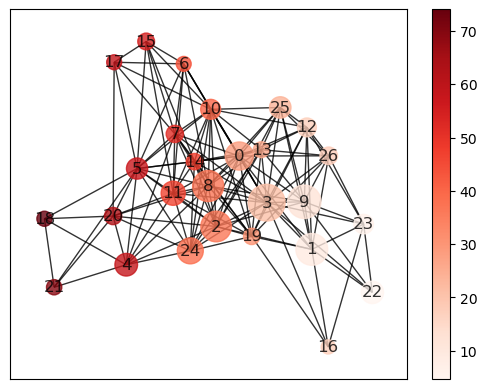

In [71]:
bm1.draw_networkx(coloring_variable='IMD', colorbar=True)

This initial TDABM plot shows us that there is a split amongst the highly deprived areas, but that the least deprived (lower values) are more closely packed in the space. 

We will now change the colouration using the functionality of the draw_networkx package.

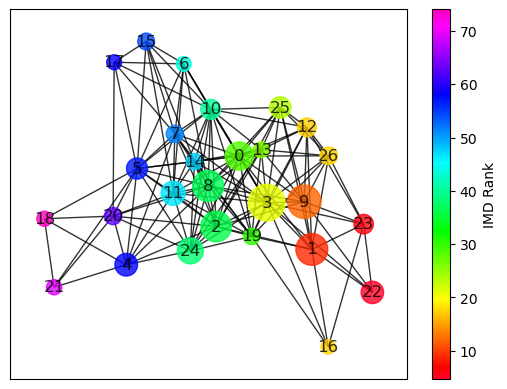

In [ ]:
# Define the colouration scheme

hsvp = cm.get_cmap("gist_rainbow")

bm1.draw_networkx(coloring_variable='IMD', color_palette=hsvp, colorbar=True, colorbar_label="IMD Rank")

plt.savefig("BMIMD.png")

This plot is now easier to interpret than the red version. In most of our work we use this rainbow colouration. R also uses the rainbow by default. Notice that we have also added a label to the colourbar.

To see where each of the variables is highest on this plot we can colour according to each of the axes. To make this more meaningful let us take the value of the axis from the real data. 

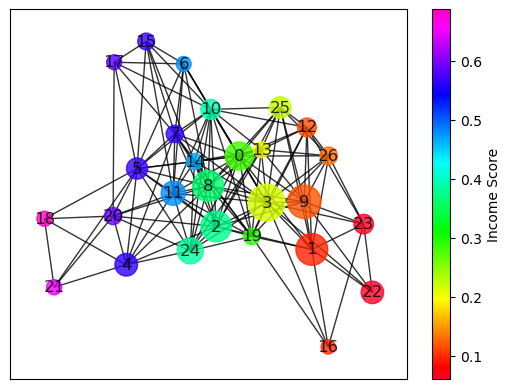

In [ ]:
cdfa1 = df1[['INC']]
bm1=pbm.BallMapper(X=adf, coloring_df=cdfa1, eps=0.5)
bm1.draw_networkx(coloring_variable='INC', color_palette=hsvp, colorbar=True, colorbar_label="Income Score")
plt.savefig("BMINC.png")


Then we just need to work through all of the others. There are no comments between the code blocks, but one codeblock is provided for each of the axes

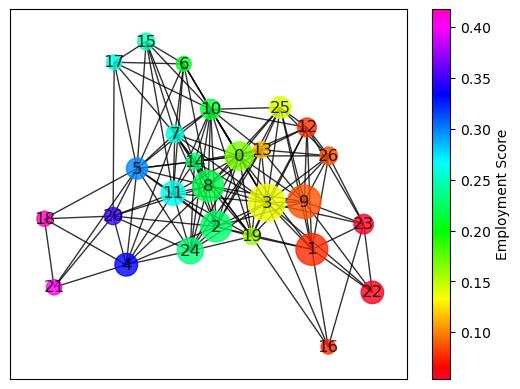

In [77]:
cdfa2 = df1[['EMP']]
bm1=pbm.BallMapper(X=adf, coloring_df=cdfa2, eps=0.5)
bm1.draw_networkx(coloring_variable='EMP', color_palette=hsvp, colorbar=True, colorbar_label="Employment Score")
plt.savefig("BMEMP.png")

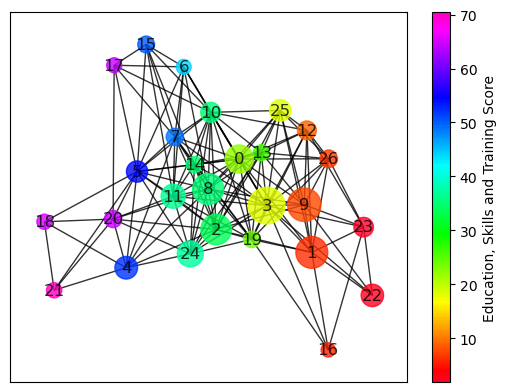

In [78]:
cdfa3 = df1[['EST']]
bm1=pbm.BallMapper(X=adf, coloring_df=cdfa3, eps=0.5)
bm1.draw_networkx(coloring_variable='EST', color_palette=hsvp, colorbar=True, colorbar_label="Education, Skills and Training Score")
plt.savefig("BMEST.png")

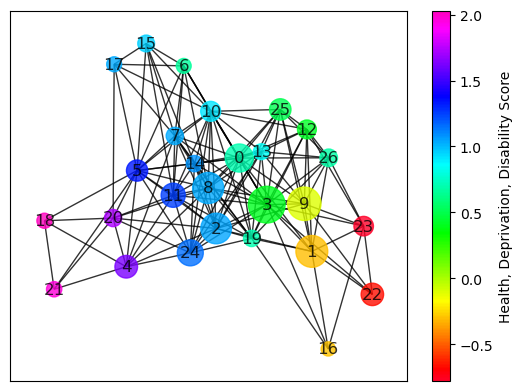

In [79]:
cdfa4 = df1[['HDD']]
bm1=pbm.BallMapper(X=adf, coloring_df=cdfa4, eps=0.5)
bm1.draw_networkx(coloring_variable='HDD', color_palette=hsvp, colorbar=True, colorbar_label="Health, Deprivation, Disability Score")
plt.savefig("BMHDD.png")

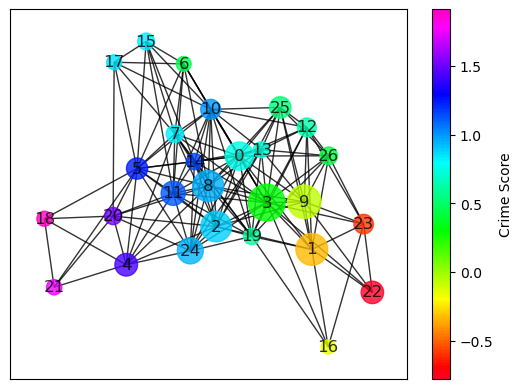

In [80]:
cdfa5 = df1[['CRM']]
bm1=pbm.BallMapper(X=adf, coloring_df=cdfa5, eps=0.5)
bm1.draw_networkx(coloring_variable='CRM', color_palette=hsvp, colorbar=True, colorbar_label="Crime Score")
plt.savefig("BMCRM.png")

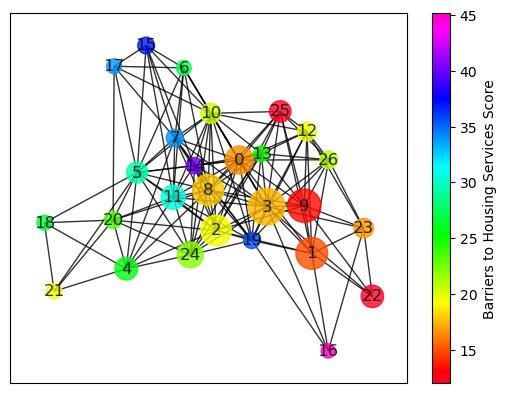

In [81]:
cdfa6 = df1[['BHS']]
bm1=pbm.BallMapper(X=adf, coloring_df=cdfa6, eps=0.5)
bm1.draw_networkx(coloring_variable='BHS', color_palette=hsvp, colorbar=True, colorbar_label="Barriers to Housing Services Score")
plt.savefig("BMBHS.png")

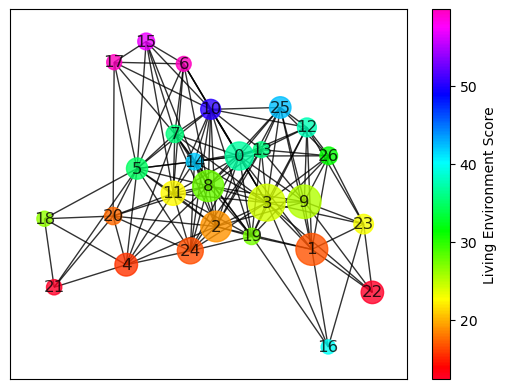

In [83]:
cdfa7 = df1[['LIV']]
bm1=pbm.BallMapper(X=adf, coloring_df=cdfa7, eps=0.5)
bm1.draw_networkx(coloring_variable='LIV', color_palette=hsvp, colorbar=True, colorbar_label="Living Environment Score")
plt.savefig("BMLIV.png")

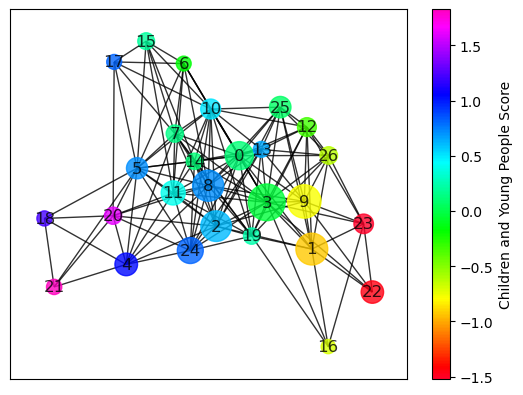

In [84]:
cdfa8 = df1[['CYP']]
bm1=pbm.BallMapper(X=adf, coloring_df=cdfa8, eps=0.5)
bm1.draw_networkx(coloring_variable='CYP', color_palette=hsvp, colorbar=True, colorbar_label="Children and Young People Score")
plt.savefig("BMCYP.png")

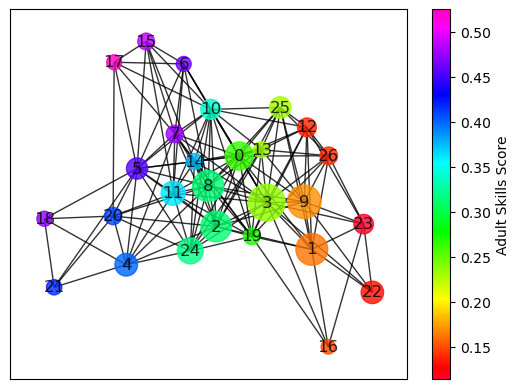

In [85]:
cdfa9 = df1[['ADS']]
bm1=pbm.BallMapper(X=adf, coloring_df=cdfa9, eps=0.5)
bm1.draw_networkx(coloring_variable='ADS', color_palette=hsvp, colorbar=True, colorbar_label="Adult Skills Score")
plt.savefig("BMADS.png")

These plots collectively allow us to talk about the data. We can see where each dimension is high, and low. The accompanying presentation talks about the different deprivation levels across the TDABM plot. 

We also need to look at the dummy variables that were created over the next 3 code blocks.

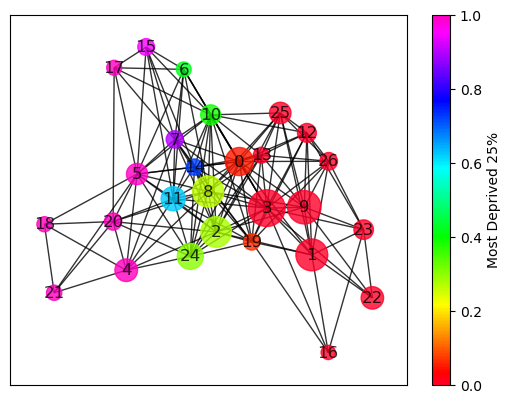

In [87]:
bm1=pbm.BallMapper(X=adf, coloring_df=cdf2, eps=0.5)
bm1.draw_networkx(coloring_variable='IMD25', color_palette=hsvp, colorbar=True, colorbar_label="Most Deprived 25%")
plt.savefig("BMIMD25.png")

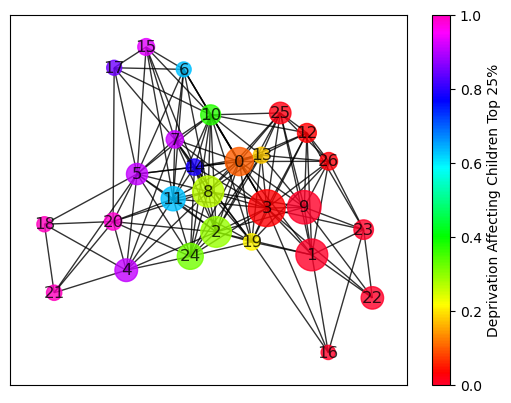

In [88]:
bm1=pbm.BallMapper(X=adf, coloring_df=cdf3, eps=0.5)
bm1.draw_networkx(coloring_variable='IDACI25', color_palette=hsvp, colorbar=True, colorbar_label="Deprivation Affecting Children Top 25%")
plt.savefig("BMIDACI25.png")

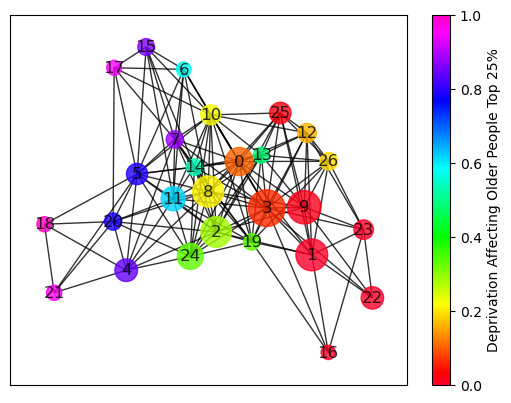

In [89]:
bm1=pbm.BallMapper(X=adf, coloring_df=cdf4, eps=0.5)
bm1.draw_networkx(coloring_variable='IDAOPI25', color_palette=hsvp, colorbar=True, colorbar_label="Deprivation Affecting Older People Top 25%")
plt.savefig("BMIDAOPI25.png")

The indexes show how there are effects on children and older people outside of the top 25% of most deprived areas. 

In order to talk more about this data it is helpful to then obtain a list of members of each of the balls. For this purpose we use the points_and_balls function and merge with the data using the index column. The merging is first with the normalised data and then with the full data using the LSOA code

In [93]:
pb1 = bm1.points_and_balls()
nd2 = nd1.merge(pb1, on='point')
df5 = df1.merge(nd2, on='LSOA2021')

df5.head()

,LSOA2021,LAD2024,LSOA_NAME_2021,LAD_NAME_2024,IMD_RANK,IMD_DECILE,IDACI_RANK,IDACI_DECILE,IDAOPI_RANK,IDAOPI_DECILE,...,CRMN_y,BHSN_y,LIVN_y,CYPN_y,ADSN_y,INDN_y,OUTN_y,pt,point,ball
0,E01004766,E08000001,Bolton 005A,Bolton,6907,3,8162,3,8581,3,...,0.714917,0.215402,0.617674,0.347129,0.466321,0.752432,0.631565,0,0,0
1,E01004767,E08000001,Bolton 005B,Bolton,13203,4,9172,3,11113,4,...,0.565304,0.103608,0.392180,0.348620,0.443869,0.607850,0.528683,1,1,0
2,E01004767,E08000001,Bolton 005B,Bolton,13203,4,9172,3,11113,4,...,0.565304,0.103608,0.392180,0.348620,0.443869,0.607850,0.528683,1,1,3
3,E01004767,E08000001,Bolton 005B,Bolton,13203,4,9172,3,11113,4,...,0.565304,0.103608,0.392180,0.348620,0.443869,0.607850,0.528683,1,1,9
4,E01004768,E08000001,Bolton 001A,Bolton,30794,10,32313,10,31155,10,...,0.421436,0.317939,0.062753,0.280015,0.202073,0.297887,0.192028,2,2,1


Notice that because the full dataframe already contains the normalised columns we end up with duplicated columns. This is not a major problem, but we could clean them up

In [95]:
ballslist = pd.DataFrame(df5[["ball","LSOA2021","LSOA_NAME_2021","LAD_NAME_2024","IMD_RANK","IMD"]])
ballslist.to_csv('ballslistr5.csv', index=False)

To see where each of the balls is we can link to the map. We can also view the lists for a particular ball.

Ball 16 stands out as being different to some of the other balls in the bottom right of the plot.

In [96]:
ball16 = ballslist[ballslist["ball"] == 16]
ball16.head()

,ball,LSOA2021,LSOA_NAME_2021,LAD_NAME_2024,IMD_RANK,IMD
1920,16,E01005410,Oldham 006A,Oldham,23533,11.211
1934,16,E01005414,Oldham 006C,Oldham,15180,19.409
1936,16,E01005415,Oldham 006D,Oldham,14390,20.422
1938,16,E01005416,Oldham 013C,Oldham,20790,13.628
2255,16,E01005521,Rochdale 003C,Rochdale,16616,17.735


In [97]:
ball16["LSOA_NAME_2021"]

1920      Oldham 006A
1934      Oldham 006C
1936      Oldham 006D
1938      Oldham 013C
2255    Rochdale 003C
3926    Tameside 023D
Name: LSOA_NAME_2021, dtype: object

In [98]:
ball13 = ballslist[ballslist["ball"] == 13]
ball13["LSOA_NAME_2021"]

669           Bury 004D
774           Bury 001B
1261    Manchester 032A
1263    Manchester 032B
1315    Manchester 057A
1367    Manchester 022C
1396    Manchester 025C
1454    Manchester 011E
1528    Manchester 026C
1600    Manchester 036C
1607    Manchester 036E
1848        Oldham 018A
1953        Oldham 021D
2054        Oldham 012D
2197      Rochdale 006C
2259      Rochdale 001C
2398      Rochdale 014D
2403      Rochdale 014E
2566       Salford 030B
2583       Salford 018A
2739       Salford 008A
2905       Salford 019C
3315     Stockport 015A
3384     Stockport 003B
3648      Tameside 025A
4766         Wigan 033C
5040       Salford 034E
5048       Salford 035A
5078    Manchester 055C
5086    Manchester 054C
5097    Manchester 056C
5114    Manchester 059C
5183       Salford 017H
5189       Salford 021I
5202       Salford 032B
5216       Salford 034A
5223       Salford 036A
5306    Manchester 032F
5321    Manchester 062A
Name: LSOA_NAME_2021, dtype: object

We can see that the members of Ball 13 are spread across Greater Manchester. Let us view these on a map.

In [101]:
df5['Ball0'] = (df5['ball']==0)*1
df5['Ball1'] = (df5['ball']==1)*1
df5['Ball2'] = (df5['ball']==2)*1
df5['Ball3'] = (df5['ball']==3)*1
df5['Ball4'] = (df5['ball']==4)*1
df5['Ball5'] = (df5['ball']==5)*1
df5['Ball6'] = (df5['ball']==6)*1
df5['Ball7'] = (df5['ball']==7)*1
df5['Ball8'] = (df5['ball']==8)*1
df5['Ball9'] = (df5['ball']==9)*1
df5['Ball10'] = (df5['ball']==10)*1
df5['Ball11'] = (df5['ball']==11)*1
df5['Ball12'] = (df5['ball']==12)*1
df5['Ball13'] = (df5['ball']==13)*1
df5['Ball14'] = (df5['ball']==14)*1
df5['Ball15'] = (df5['ball']==15)*1
df5['Ball16'] = (df5['ball']==16)*1
df5['Ball17'] = (df5['ball']==17)*1
df5['Ball18'] = (df5['ball']==18)*1
df5['Ball19'] = (df5['ball']==19)*1
df5['Ball20'] = (df5['ball']==20)*1
df5['Ball21'] = (df5['ball']==21)*1
df5['Ball22'] = (df5['ball']==22)*1
df5['Ball23'] = (df5['ball']==23)*1
df5['Ball24'] = (df5['ball']==24)*1
df5['Ball25'] = (df5['ball']==25)*1
df5['Ball26'] = (df5['ball']==26)*1
df5['Ball27'] = (df5['ball']==27)*1
df5['Ball28'] = (df5['ball']==28)*1


For the map we will first merge the new dataset with the dummies into the map file

In [102]:
ew_shape_merged = ew_shape_man.merge(
    df5, 
    left_on="LSOA21CD", 
    right_on="LSOA2021",
    how="left"
)

Then to plot the membership of a ball it is simply a case of editing the following block of code to change the ball number

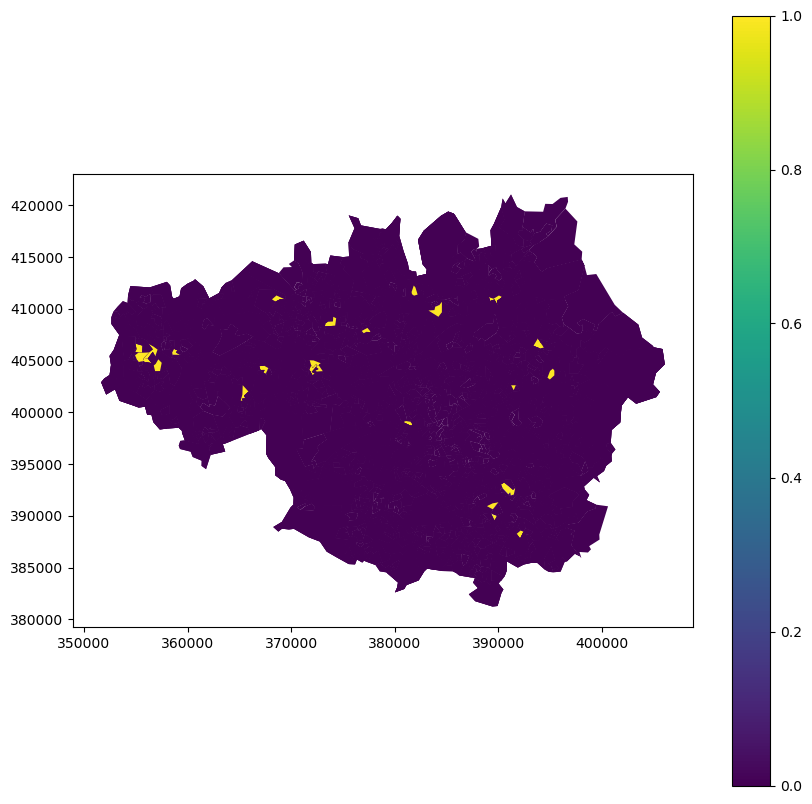

In [105]:
ew_shape_merged.plot(
    column="Ball21",
    legend=True,
    figsize=(10, 10)
)
plt.savefig("mapBall21.png")

In [ ]:
imdm = df5.groupby('ball')['IMD'].mean()
incm = df5.groupby('ball')['INC'].mean()
empm = df5.groupby('ball')['EMP'].mean()
estm = df5.groupby('ball')['EST'].mean()
hddm = df5.groupby('ball')['HDD'].mean()
crmm = df5.groupby('ball')['CRM'].mean()
bhsm = df5.groupby('ball')['BHS'].mean()
livm = df5.groupby('ball')['LIV'].mean()
cypm = df5.groupby('ball')['CYP'].mean()
adsm = df5.groupby('ball')['ADS'].mean()
idacim = df5.groupby('ball')['IDACI'].mean()
idaopim = df5.groupby('ball')['IDAOPI'].mean()

ballmeans = pd.DataFrame([imdm,incm,empm,estm,hddm,crmm,bhsm,livm,cypm,adsm,idacim,idaopim])
ballmeans = ballmeans.transpose()

ballmeans.to_csv("ballmeans.csv", index=False)

The data has been saved to a file called ballmeans.csv

We can view the header to understand what has been created. 

In [108]:
ballmeans.head()

,IMD,INC,EMP,EST,HDD,CRM,BHS,LIV,CYP,ADS,IDACI,IDAOPI
ball,,,,,,,,,,,,
0,28.438482,0.281788,0.167757,21.998969,0.706911,0.747950,16.519804,36.922018,0.109186,0.262914,0.422149,0.237029
1,8.878716,0.096342,0.075800,6.401355,-0.304534,-0.333311,14.913328,16.703733,-0.920632,0.162166,0.145143,0.082034
2,36.386288,0.375676,0.226179,33.484248,1.045156,0.887051,19.496171,18.993836,0.600465,0.313061,0.515756,0.317537
3,20.926030,0.214694,0.136901,18.057535,0.414085,0.311602,17.309530,24.125945,-0.037760,0.235606,0.329264,0.182292
4,58.018309,0.564402,0.332461,51.991127,1.626167,1.427034,25.722088,15.660534,1.030593,0.399784,0.700147,0.497652


There is a lot more which we could do with the data as we will discuss at the start of the afternoon session.